In [1]:
import sys
sys.path.append('..')
import pathlib
import numpy as np
from skimage.color import rgb2gray
from skimage.transform import resize, rescale
from skimage.exposure import adjust_gamma, equalize_hist
from skimage.filters import gaussian, laplace

from utils import transform_and_store, plot_transformation_comparison


In [2]:
main_path='../dados/Hypercellularity/'

# Aplicando resize nas imagens

In [3]:
def apply_resizing(input_image):
    return resize(image=input_image, output_shape=(700,700)) 

transform_and_store(
    main_path=main_path,
    data_folder_name='00-original', 
    new_folder_name='01-resized', 
    transformation_function=apply_resizing
    )

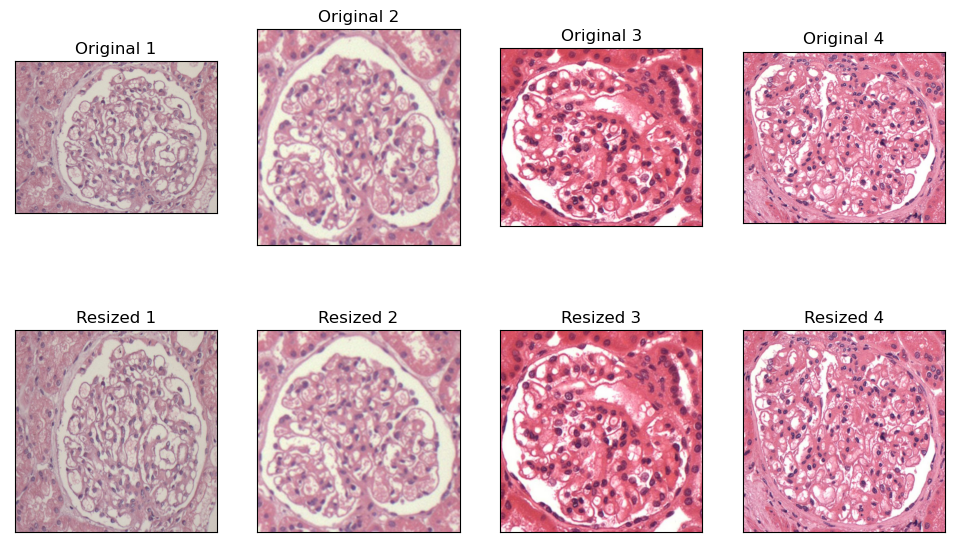

In [4]:
plot_transformation_comparison(
    main_path=main_path,
    data_folder_name='00-original', 
    new_folder_name='01-resized',
    )

# Transformando imagens em gray scale 

In [5]:
def apply_gray_transformation(input_image):
    return rgb2gray(input_image)

transform_and_store(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='02-grayScaled', 
    transformation_function=apply_gray_transformation
    )

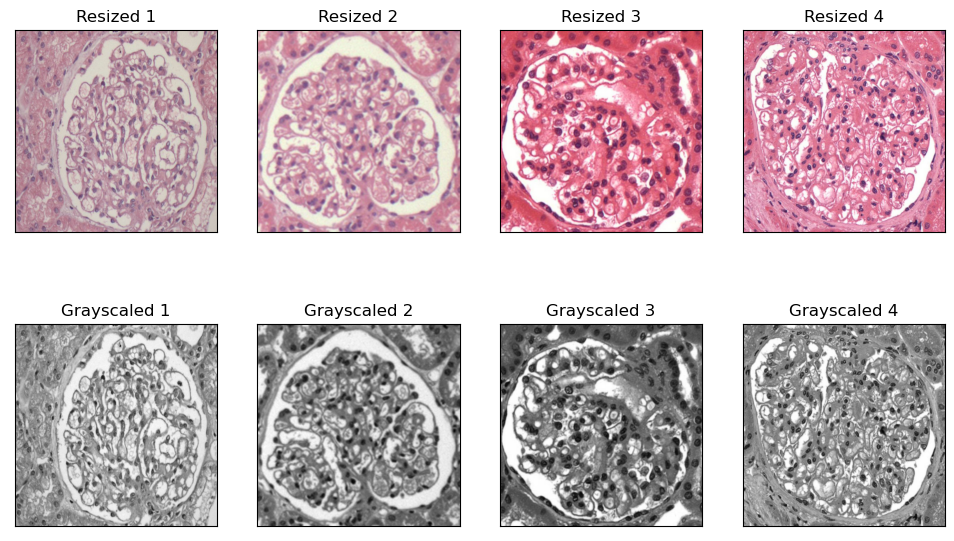

In [6]:
plot_transformation_comparison(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='02-grayScaled', 
    )

# Aplicando equalização de histograma em gray scale

In [7]:
def apply_hist_transformation(input_image):
    return equalize_hist(input_image)

transform_and_store(
    main_path=main_path,
    data_folder_name='02-grayScaled', 
    new_folder_name='03-equalizesHist', 
    transformation_function=apply_hist_transformation
    )

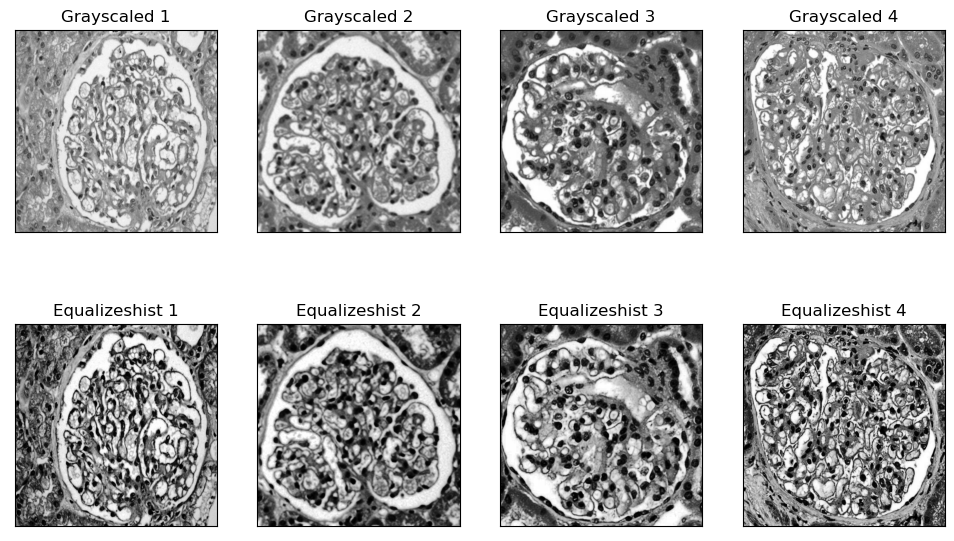

In [8]:
plot_transformation_comparison(
    main_path=main_path,
    data_folder_name='02-grayScaled', 
    new_folder_name='03-equalizesHist', 
    )

# Aplicando correção gamma

### Gamma I (valor=1)

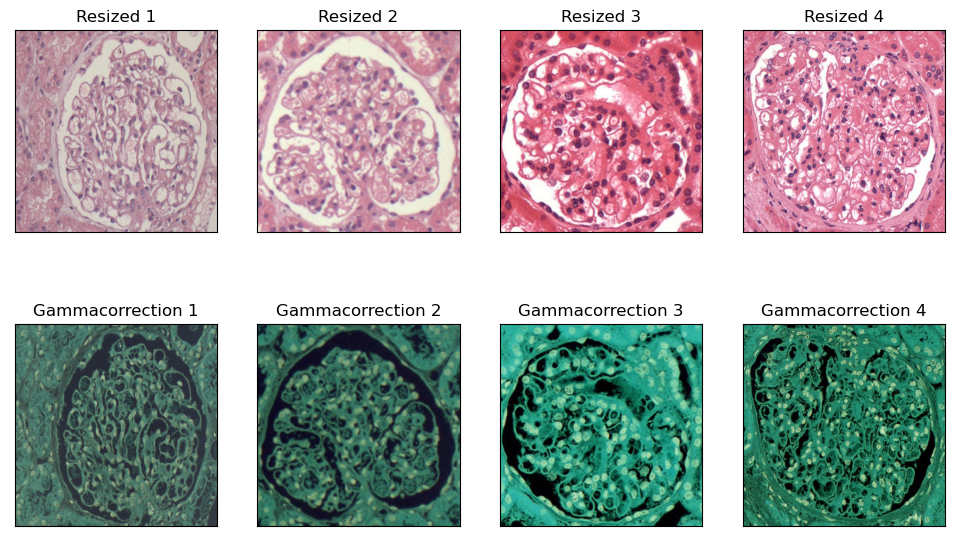

In [9]:
def apply_gamma_transformation(input_image):
    return adjust_gamma(input_image, gamma=1)

transform_and_store(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='04-gammaCorrection', 
    transformation_function=apply_gamma_transformation
    )

plot_transformation_comparison(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='04-gammaCorrection', 
    )

### Gamma II (valor=2)

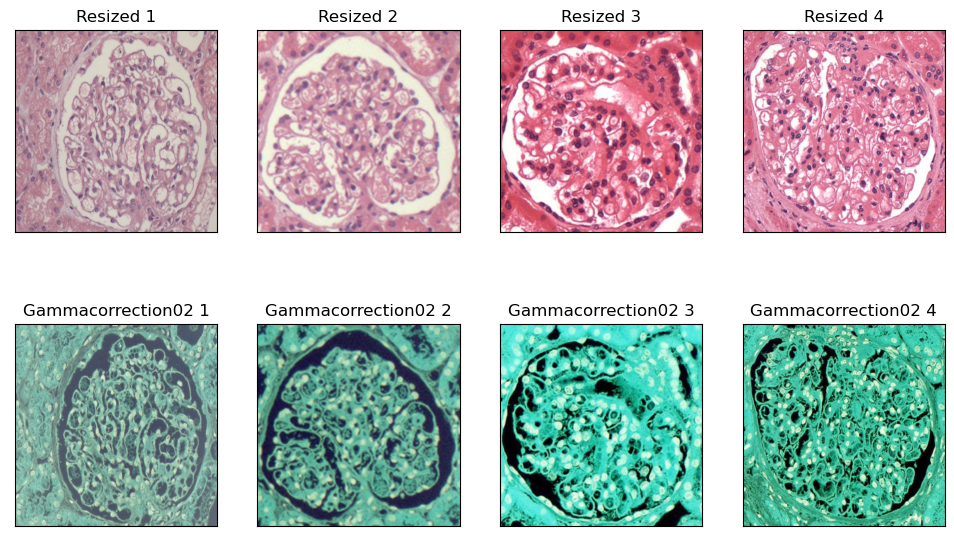

In [10]:
def apply_gamma_transformation(input_image):
    return adjust_gamma(input_image, gamma=2)

transform_and_store(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='05-gammaCorrection02', 
    transformation_function=apply_gamma_transformation
    )

plot_transformation_comparison(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='05-gammaCorrection02', 
    )

### Gamma III (valor=3)

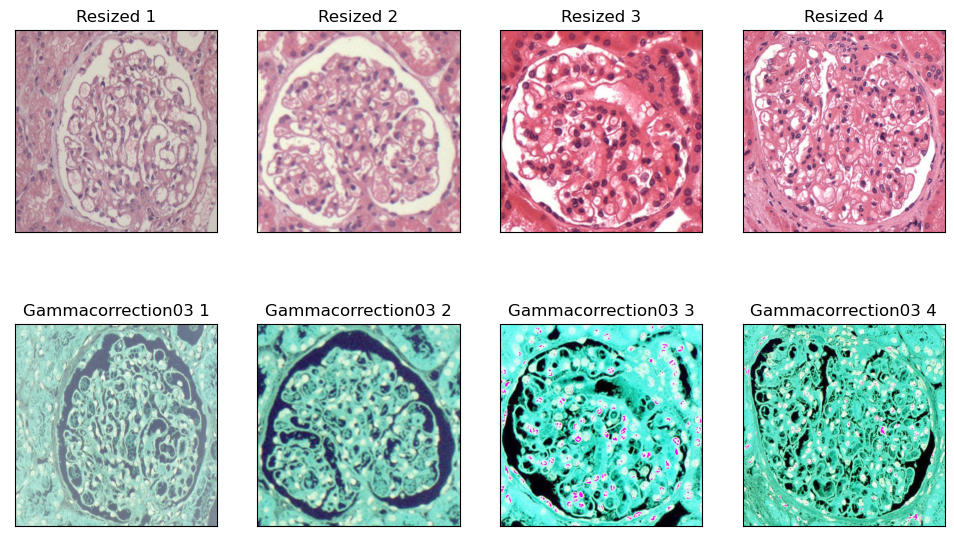

In [11]:
def apply_gamma_transformation(input_image):
    return adjust_gamma(input_image, gamma=3)

transform_and_store(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='06-gammaCorrection03', 
    transformation_function=apply_gamma_transformation
    )

plot_transformation_comparison(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='06-gammaCorrection03', 
    )

# Aplicando filtro gaussiano

/tmp/ipykernel_10765/214684364.py:2: FutureWarning: `multichannel` is a deprecated argument name for `gaussian`. It will be removed in version 1.0. Please use `channel_axis` instead.
  return gaussian(input_image, sigma=3, multichannel=True)


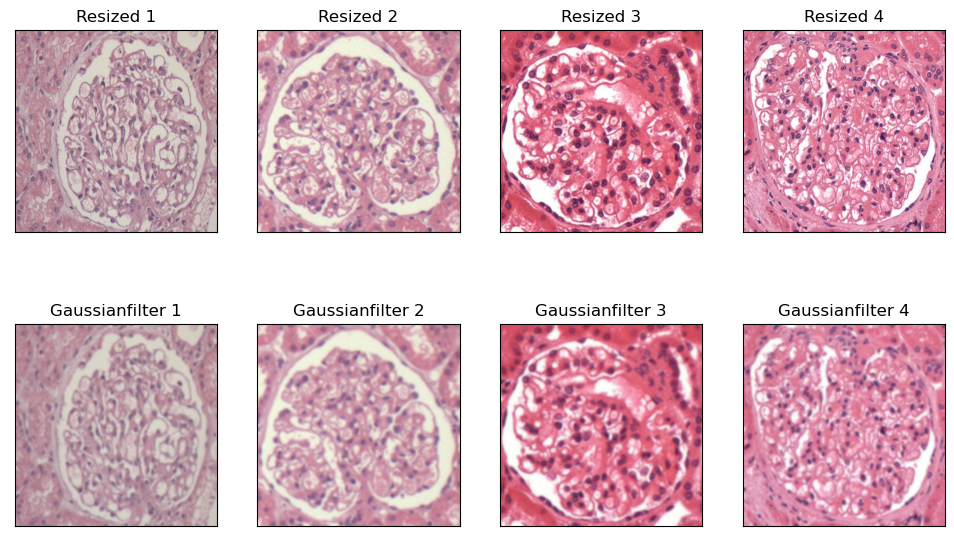

In [12]:

def apply_gaussian_transformation(input_image):
    return gaussian(input_image, sigma=3, multichannel=True)

transform_and_store(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='07-gaussianFilter', 
    transformation_function=apply_gaussian_transformation
    )

plot_transformation_comparison(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='07-gaussianFilter', 
    )

# Aplicando filtro laplace

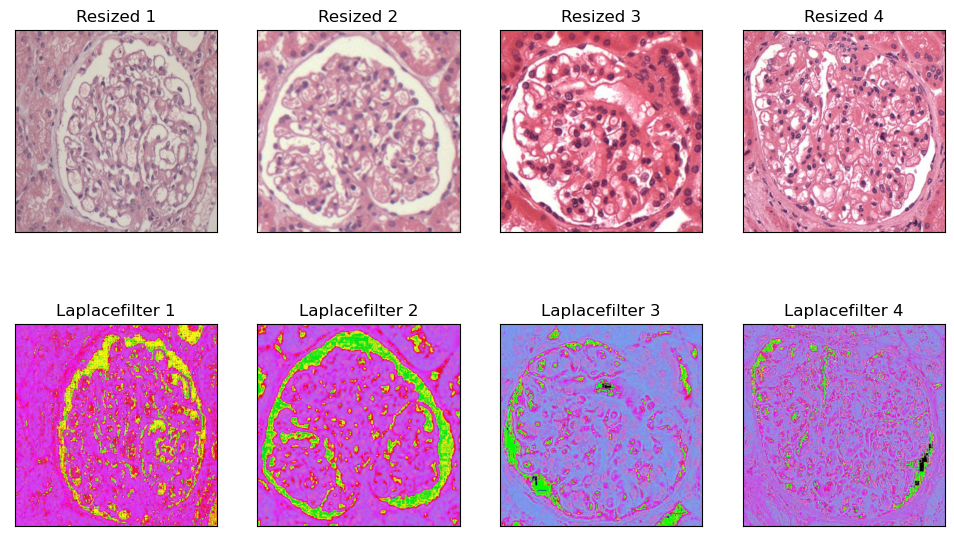

In [13]:

def apply_laplace_transformation(input_image):
    return laplace(input_image.astype(float) , ksize=4)

transform_and_store(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='08-laplaceFilter', 
    transformation_function=apply_laplace_transformation
    )

plot_transformation_comparison(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='08-laplaceFilter', 
    )

In [14]:
import cv2

In [15]:
path = '../dados/Hypercellularity/00-original/n/113IP71229AAE.jpg'
img = cv2.imread(path,1) # 1 = read image as color
sift = cv2.SIFT_create()
kp = sift.detect(img,None)
img2 = cv2.drawKeypoints(img,kp,None)
cv2.imwrite('siftkpcolor.jpg',img2)

True

In [16]:
img = cv2.imread(path,0) # 0 = read image as gray
sift = cv2.SIFT_create()
kp = sift.detect(img,None)
img2 = cv2.drawKeypoints(img,kp,None)
cv2.imwrite("siftkpgray.jpg",img2)

True

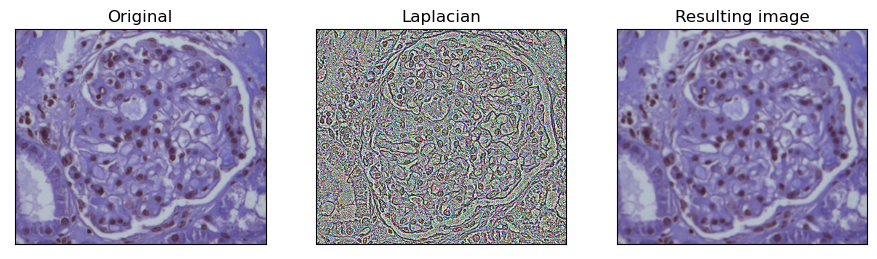

In [17]:
from matplotlib import pyplot as plt

image = cv2.imread(path) # reads the image
image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV) # convert to HSV
image2 = cv2.cvtColor(image, cv2.COLOR_HSV2BGR)
new_image = cv2.Laplacian(image2,cv2.CV_64F)

plt.figure(figsize=(11,6))
plt.subplot(131), plt.imshow(image2, cmap='gray'),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(np.uint8(new_image+255), cmap='gray'),plt.title('Laplacian')
plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(np.uint8(image2+255) + np.uint8(new_image+255), cmap='gray'),plt.title('Resulting image')
plt.xticks([]), plt.yticks([])
plt.show()

In [18]:
figure_size = 9

image = io.imread('../dados/Hypercellularity/01-resized/n/113IP71229AAE.jpg') 
image2 = io.imread('../dados/Hypercellularity/07-gaussianFilter/n/113IP71229AAE.jpg') 

plt.figure(figsize=(11,6))
plt.subplot(121), plt.imshow(image),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(image2),plt.title('Gaussian Filter')
plt.xticks([]), plt.yticks([])
plt.show()

NameError: name 'io' is not defined

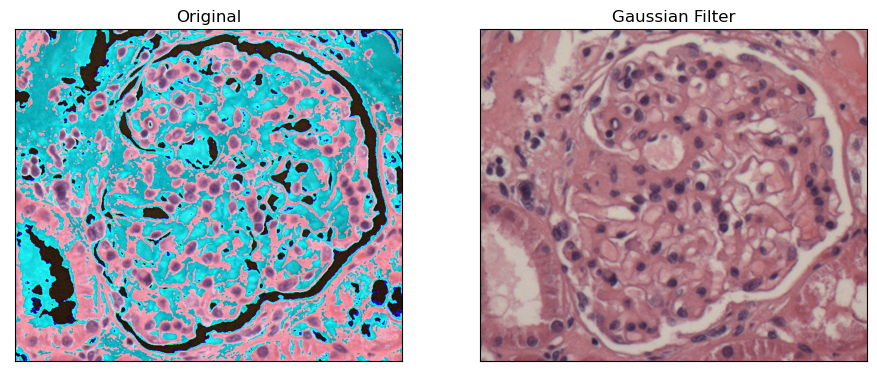

In [ ]:
image = cv2.imread(path) # reads the image
plt.figure(figsize=(11,6))
plt.subplot(121), plt.imshow(cv2.cvtColor(np.uint8(image * 1.5) , cv2.COLOR_BGR2RGB)),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)),plt.title('Gaussian Filter')
plt.xticks([]), plt.yticks([])
plt.show()

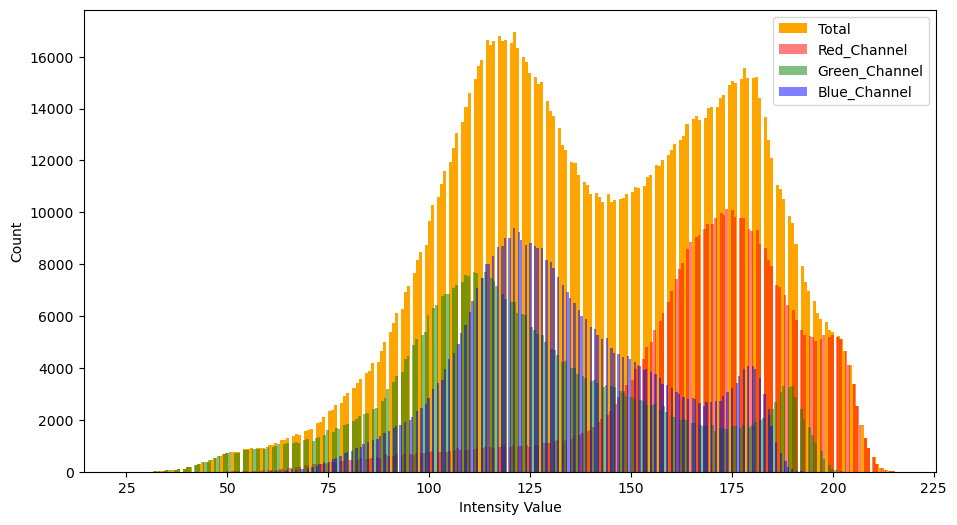

In [ ]:
from skimage import io

img = io.imread(path)
plt.figure(figsize=(11,6))
_ = plt.hist(img.ravel(), bins = 256, color = 'orange', )
_ = plt.hist(img[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5)
_ = plt.hist(img[:, :, 1].ravel(), bins = 256, color = 'Green', alpha = 0.5)
_ = plt.hist(img[:, :, 2].ravel(), bins = 256, color = 'Blue', alpha = 0.5)
_ = plt.xlabel('Intensity Value')
_ = plt.ylabel('Count')
_ = plt.legend(['Total', 'Red_Channel', 'Green_Channel', 'Blue_Channel'])
plt.show()

In [ ]:

def adjust_gamma(image, gamma=1.0):

   invGamma = 1.0 / gamma
   table = np.array([((i / 255.0) ** invGamma) * 255
      for i in np.arange(0, 256)]).astype("uint8")

   return cv2.LUT(image, table)


original = cv2.imread(path, 1)



gamma = 0.5                                   # change the value here to get different result
adjusted = adjust_gamma(original, gamma=gamma)
adjusted2 = adjust_gamma(original, gamma=1.5)
cv2.putText(adjusted, "g={}".format(gamma), (10, 30),cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 255), 3)
cv2.putText(adjusted2, "g={}".format(1.5), (10, 30),cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 255), 3)

cv2.imwrite('original.jpg',original)
cv2.imwrite("gammam image 1.jpg", adjusted)
cv2.imwrite("gammam image 2.jpg", adjusted2)


True

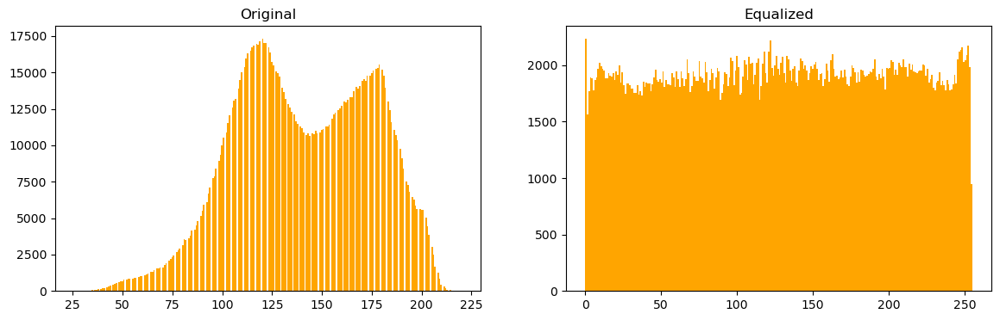

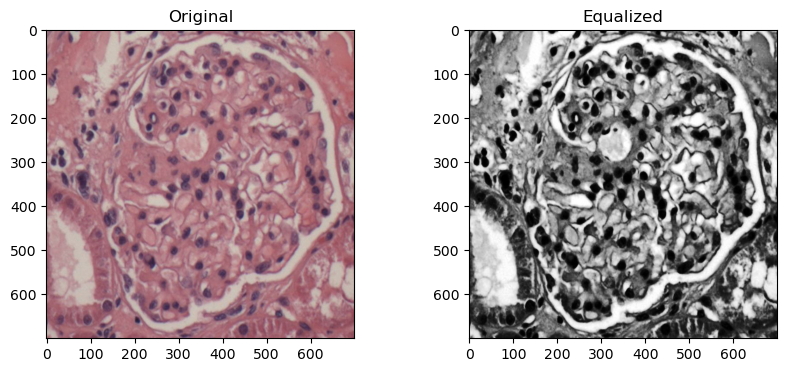

In [ ]:
img = io.imread('../dados/Hypercellularity/01-resized/n/113IP71229AAE.jpg')
img2 = io.imread('../dados/Hypercellularity/03-equalizesHist/n/113IP71229AAE.jpg')

plt.figure(figsize=(14,4))
plt.subplot(121), plt.hist(img.ravel(), bins = 256, color = 'orange', ),plt.title('Original')

plt.subplot(122), plt.hist(img2.ravel(), bins = 256, color = 'orange', ),plt.title('Equalized')

plt.figure(figsize=(10,4))
plt.subplot(121), plt.imshow(img),plt.title('Original')

plt.subplot(122),  plt.imshow(img2, cmap='gray'),plt.title('Equalized')

plt.show()

plt.show()


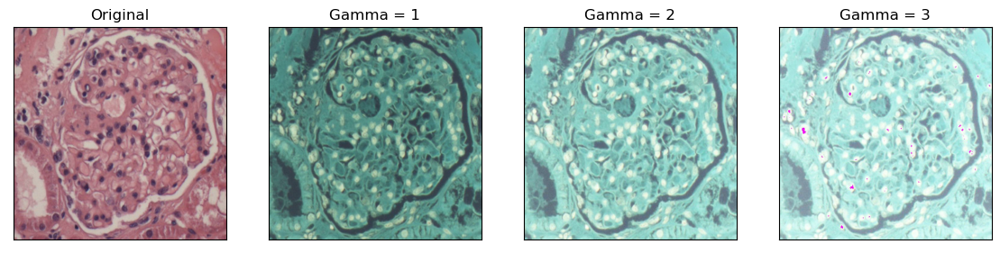

In [ ]:
'dados/Hypercellularity/04-gammaCorrection/n/113IP71229AAE.jpg'

img = io.imread('../dados/Hypercellularity/01-resized/n/113IP71229AAE.jpg')
img2 = io.imread('../dados/Hypercellularity/04-gammaCorrection/n/113IP71229AAE.jpg')
img3 = io.imread('../dados/Hypercellularity/05-gammaCorrection02/n/113IP71229AAE.jpg')
img4 = io.imread('../dados/Hypercellularity/06-gammaCorrection03/n/113IP71229AAE.jpg')

plt.figure(figsize=(14,8))
plt.subplot(141), plt.imshow(img, cmap='gray'),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(142), plt.imshow(img2, cmap='gray'),plt.title('Gamma = 1')
plt.xticks([]), plt.yticks([])
plt.subplot(143), plt.imshow(img3, cmap='gray'),plt.title('Gamma = 2')
plt.xticks([]), plt.yticks([])
plt.subplot(144), plt.imshow(img4, cmap='gray'),plt.title('Gamma = 3')
plt.xticks([]), plt.yticks([])
plt.show()

error: OpenCV(4.6.0) /io/opencv/modules/imgproc/src/color.simd_helpers.hpp:94: error: (-2:Unspecified error) in function 'cv::impl::{anonymous}::CvtHelper<VScn, VDcn, VDepth, sizePolicy>::CvtHelper(cv::InputArray, cv::OutputArray, int) [with VScn = cv::impl::{anonymous}::Set<1>; VDcn = cv::impl::{anonymous}::Set<3, 4>; VDepth = cv::impl::{anonymous}::Set<0, 2, 5>; cv::impl::{anonymous}::SizePolicy sizePolicy = cv::impl::<unnamed>::NONE; cv::InputArray = const cv::_InputArray&; cv::OutputArray = const cv::_OutputArray&]'
> Unsupported depth of input image:
>     'VDepth::contains(depth)'
> where
>     'depth' is 6 (CV_64F)


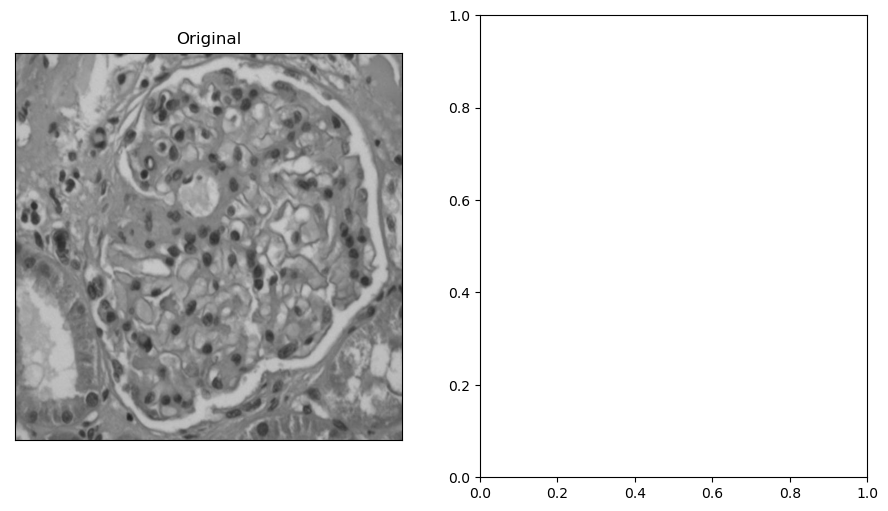

In [ ]:
img = cv2.imread('../dados/Hypercellularity/01-resized/n/113IP71229AAE.jpg',0)

# Apply Gaussian Blur
blur = cv2.GaussianBlur(img,(3,3),0)

# Apply Laplacian operator in some higher datatype
laplacian = cv2.Laplacian(blur,cv2.CV_64F)

laplacian1 = laplacian/laplacian.max()

image = cv2.imread(path) # reads the image
plt.figure(figsize=(11,6))
plt.subplot(121), plt.imshow(cv2.cvtColor( img, cv2.COLOR_BGR2RGB)),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(cv2.cvtColor(laplacian1, cv2.COLOR_BGR2RGB)),plt.title('Gaussian Filter')
plt.xticks([]), plt.yticks([])
plt.show()